# Assignment-3: Exploratory Data Analysis (EDA) and Hypothesis Testing on Preprocessed Earthquake Dataset



## Objective  
Conduct comprehensive exploratory data analysis (EDA) and statistical hypothesis testing on the preprocessed earthquake dataset to uncover patterns, relationships, and significant differences in seismic characteristics that influence earthquake damage potential and geographical distribution.


## Dataset Details  
- **Dataset:** Preprocessed Earthquake Dataset from `data_preprocessing_v3.ipynb`  
- **Shape:** 109,848 rows × 17 columns  
- **Key Features:** latitude, longitude, depth, magnitude (mag), moment magnitude (Mw), rms, magType, type, status, temporal features (Year, Month, Day, Hour, Minute, Second, DayOfWeek), damage_potential  
- **Target Variable:** `damage_potential` (0-10 scale using HAZUS methodology)  
- **Dataset Link:** [Preprocessed Dataset](https://drive.google.com/file/d/1OqEP-tExNBrWYI4lmyQhmiggQmxgJRWp/view?usp=sharing)


## Part 1: Exploratory Data Analysis (EDA)


### EDA Task 1: Temporal Distribution Analysis  
**Objective:** Analyze earthquake frequency and magnitude trends over time.  

**Tasks:**  
- Plot earthquake frequency by Year, Month, and DayOfWeek  
- Identify seasonal patterns and temporal trends  
- Calculate mean magnitude and damage potential by temporal dimensions  
- Visualize time series of earthquake counts and average magnitude over years  
- Create heatmap of earthquakes by Month and DayOfWeek  

**Deliverables:**  
Line plots, bar charts, heatmaps, and summary statistics documenting temporal patterns.


In [ ]:
import pandas as pd
import numpy as np
df = pd.read_csv(r'C:\Users\Surya\projects\impactsenseAI-Infosys-Intern-project\milestone_2\week_3\Day_13\preprocessed_earthquake_data.csv')

round(df.isnull().sum()*100/df.shape[0],2)

latitude            0.00
longitude           0.00
depth               0.00
mag                 0.00
magType             0.00
rms                 0.00
type                0.00
status              0.00
Year                0.00
Month               0.00
Day                 0.00
Hour                0.00
Minute              0.00
Second              0.00
DayOfWeek           0.00
Mw                  0.12
damage_potential    0.00
dtype: float64

In [14]:
df = df.dropna(subset=['Mw'])
round(df.isnull().sum()*100/df.shape[0],2)


latitude            0.0
longitude           0.0
depth               0.0
mag                 0.0
magType             0.0
rms                 0.0
type                0.0
status              0.0
Year                0.0
Month               0.0
Day                 0.0
Hour                0.0
Minute              0.0
Second              0.0
DayOfWeek           0.0
Mw                  0.0
damage_potential    0.0
dtype: float64

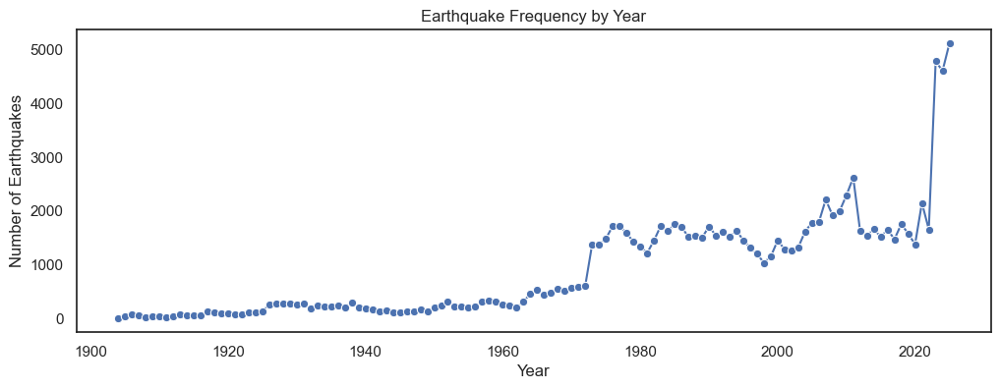

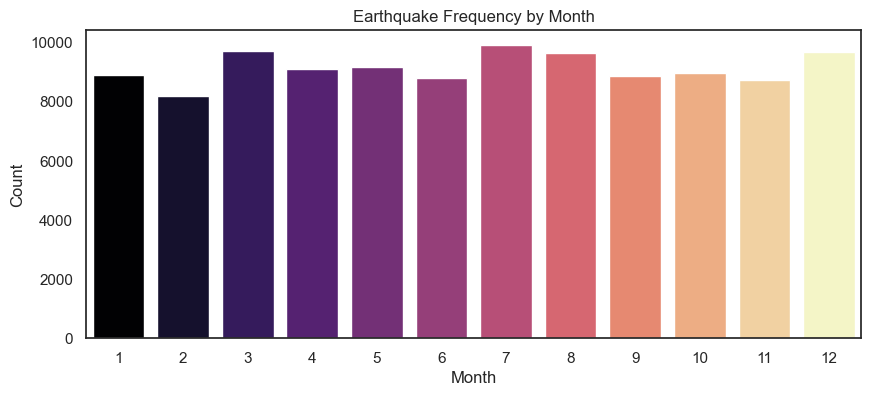

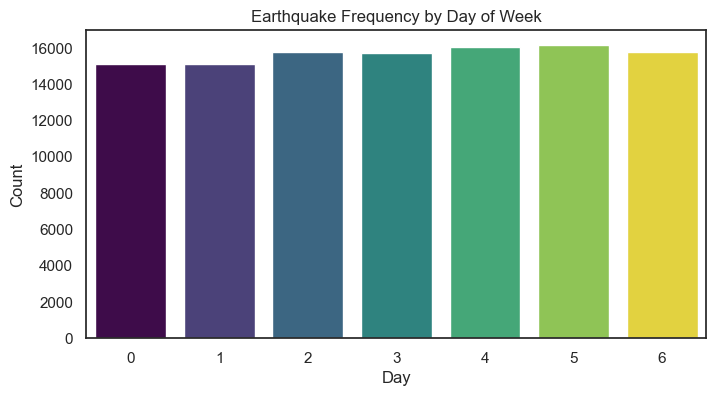

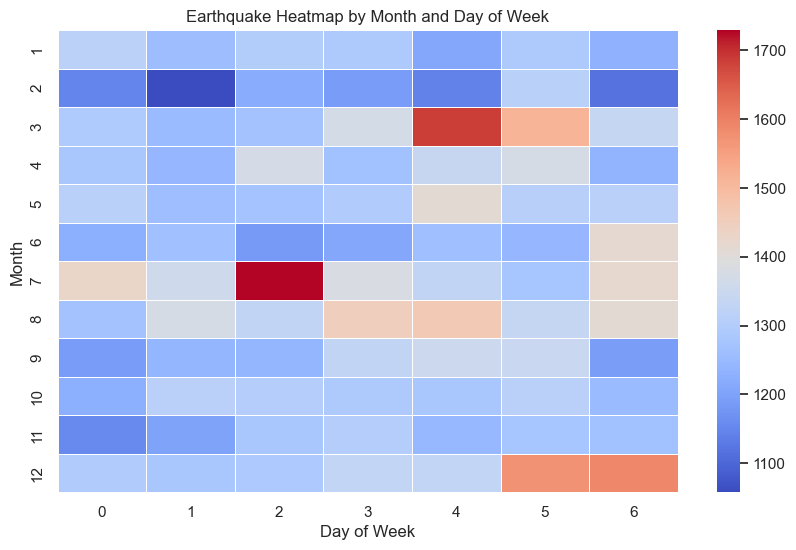

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="white")
plt.rcParams['figure.figsize'] = (12,5)

# --- 1️⃣ Earthquake frequency by Year
year_counts = df['Year'].value_counts().sort_index()

plt.figure(figsize=(12,4))
sns.lineplot(x=year_counts.index, y=year_counts.values, marker='o')
plt.title("Earthquake Frequency by Year")
plt.xlabel("Year")
plt.ylabel("Number of Earthquakes")
plt.show()

# --- 2️⃣ Frequency by Month
month_counts = df['Month'].value_counts().sort_index()
plt.figure(figsize=(10,4))
sns.barplot(x=month_counts.index, y=month_counts.values, hue=month_counts.index, legend=False, palette="magma")
plt.title("Earthquake Frequency by Month")
plt.xlabel("Month")
plt.ylabel("Count")
plt.show()

# --- 3️⃣ Frequency by Day of Week
dow_counts = df['DayOfWeek'].value_counts()
plt.figure(figsize=(8,4))
sns.barplot(x=dow_counts.index, y=dow_counts.values, hue=dow_counts.index, legend=False, palette="viridis")
plt.title("Earthquake Frequency by Day of Week")
plt.xlabel("Day")
plt.ylabel("Count")
plt.show()

# --- 5️⃣ Heatmap of Month vs DayOfWeek
month_day = pd.crosstab(df['Month'], df['DayOfWeek'])
plt.figure(figsize=(10,6))
sns.heatmap(month_day, cmap="coolwarm", linewidths=.5)
plt.title("Earthquake Heatmap by Month and Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Month")
plt.show()

### EDA Task 2: Geographical Distribution Analysis  
**Objective:** Explore spatial patterns of earthquake epicenters.  

**Tasks:**  
- Generate scatter plot of latitude vs. longitude colored by magnitude or damage_potential  
- Create density maps or 2D histograms showing earthquake hotspots  
- Analyze earthquake distribution by geographical regions (latitude/longitude bins)  
- Calculate correlation between geographical coordinates and seismic characteristics  
- Identify high-risk geographical areas based on damage_potential  

**Deliverables:**  
Scatter plots, density maps, geospatial visualizations, and regional summary statistics.


In [16]:
# --- 🧩 EDA Task 2: Geographical Distribution Analysis ---

import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np



# 1️⃣ Scatter plot (Latitude vs Longitude by Magnitude)
fig1 = px.scatter_geo(
    df, lat='latitude', lon='longitude',
    color='Mw',
    color_continuous_scale='viridis',
    title='Global Earthquake Distribution (Colored by Magnitude)',
    projection='natural earth'
)
fig1.show()

# 2️⃣ Scatter plot (Latitude vs Longitude by Damage Potential)
fig2 = px.scatter_geo(
    df, lat='latitude', lon='longitude',
    color='damage_potential',
    color_continuous_scale='Reds',
    title='Global Earthquake Damage Potential Map',
    projection='natural earth'
)
fig2.show()

# 3️⃣ Density Map (Hotspots by Magnitude)
fig3 = px.density_mapbox(
    df, lat='latitude', lon='longitude', z='Mw',
    radius=10, center=dict(lat=0, lon=0), zoom=0,
    mapbox_style='carto-positron',
    color_continuous_scale='hot',
    title='Earthquake Hotspot Density Map (by Magnitude)'
)
fig3.show()

# 4️⃣ Correlation between Coordinates and Seismic Features
geo_corr = df[['latitude', 'longitude', 'Mw', 'depth', 'damage_potential']].corr()
print("\n🔹 Geographical Correlations:\n", geo_corr, "\n")

# 5️⃣ Regional Summary Statistics
lat_bins = pd.cut(df['latitude'], bins=[-90, -60, -30, 0, 30, 60, 90])
lon_bins = pd.cut(df['longitude'], bins=[-180, -120, -60, 0, 60, 120, 180])

region_summary = df.groupby([lat_bins, lon_bins])[['Mw', 'depth', 'damage_potential']].mean().reset_index()
print("🔹 Regional Summary Statistics:\n", region_summary.head(10), "\n")

# 6️⃣ Identify High-Risk Zones
high_risk = df[df['damage_potential'] == 10][['latitude', 'longitude', 'Mw', 'depth']]
print("🔹 High-Risk Earthquake Zones (Top 10):\n", high_risk.head(10))


C:\Users\Surya\AppData\Local\Temp\ipykernel_30784\285278342.py:31: DeprecationWarning:

*density_mapbox* is deprecated! Use *density_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/




🔹 Geographical Correlations:
                   latitude  longitude        Mw     depth  damage_potential
latitude          1.000000   0.215006 -0.050931 -0.117134          0.106421
longitude         0.215006   1.000000  0.071902 -0.084830          0.088558
Mw               -0.050931   0.071902  1.000000  0.069485          0.130835
depth            -0.117134  -0.084830  0.069485  1.000000         -0.895932
damage_potential  0.106421   0.088558  0.130835 -0.895932          1.000000 

🔹 Regional Summary Statistics:
      latitude     longitude        Mw     depth  damage_potential
0  (-90, -60]  (-180, -120]  5.827111 -0.466352         10.000000
1  (-90, -60]   (-120, -60]  6.496075 -0.416808         10.000000
2  (-90, -60]      (-60, 0]  6.271291 -0.403878          9.997679
3  (-90, -60]       (0, 60]  5.000000 -0.476968         10.000000
4  (-90, -60]     (60, 120]  5.666750 -0.370130         10.000000
5  (-90, -60]    (120, 180]  5.784298 -0.457146         10.000000
6  (-60, -30]  (-

C:\Users\Surya\AppData\Local\Temp\ipykernel_30784\285278342.py:48: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### EDA Task 3: Magnitude and Damage Potential Relationship  
**Objective:** Analyze the relationship between earthquake magnitude and damage potential.  

**Tasks:**  
- Create scatter plot: Magnitude (mag) vs. Damage Potential with depth color-coding  
- Plot Moment Magnitude (Mw) vs. Damage Potential  
- Generate distribution histograms for mag, Mw, and damage_potential (with KDE)  
- Calculate correlation coefficients (Pearson and Spearman) between mag/Mw and damage_potential  
- Analyze outliers and their characteristics  

**Deliverables:**  
Scatter plots, histograms, KDE plots, and correlation matrices.


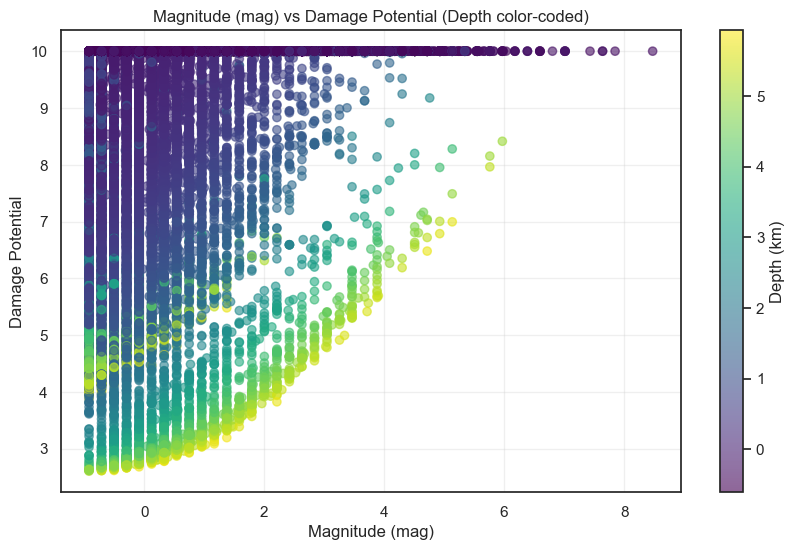

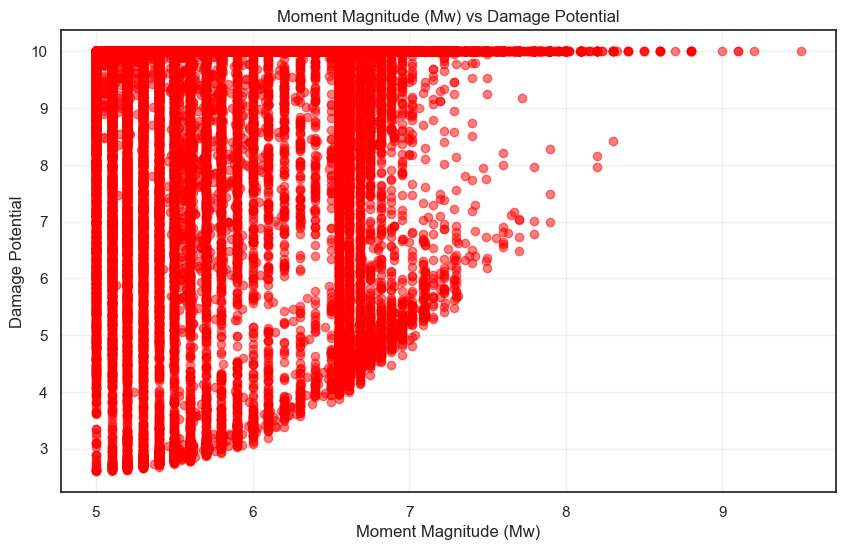

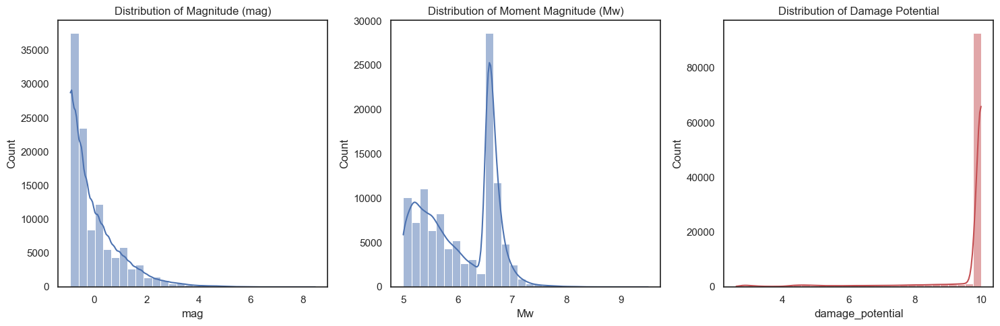

🔹 Correlation Results:
                   Metric  Pearson Correlation  Spearman Correlation
0        Magnitude (mag)             0.032292              0.046235
1  Moment Magnitude (Mw)             0.130835              0.166445 

🔹 Outlier Samples (Top 10):
   latitude  longitude     depth       mag magType       rms        type  \
0    41.758     23.249 -0.430517  3.296720      mw  0.255959  earthquake   
1    41.802     23.108 -0.430517  2.920854      mw  0.227615  earthquake   
2    52.763    160.277 -0.291162  4.716657      mw  0.360656  earthquake   
3    51.424    161.638 -0.430517  4.299028      mw  0.331543  earthquake   
4    30.684    100.608 -0.430517  3.442890      mw  0.266982  earthquake   
5     8.962    -84.042 -0.476968  3.860518      mw  0.299268  earthquake   
6   -32.312    -73.706 -0.476968  2.670277      mw  0.209512  earthquake   
7     5.384    -80.533 -0.430517  2.190004      mw  0.172501  earthquake   
8    10.082    -85.608 -0.384065  2.712040      mw  0.2110

In [ ]:


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import pearsonr, spearmanr


# --- 1️⃣ Scatter Plot: Magnitude vs Damage Potential (Depth color-coded) ---
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df['mag'], df['damage_potential'], c=df['depth'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Depth (km)')
plt.title("Magnitude (mag) vs Damage Potential (Depth color-coded)")
plt.xlabel("Magnitude (mag)")
plt.ylabel("Damage Potential")
plt.grid(True, alpha=0.3)
plt.show()

# --- 2️⃣ Scatter Plot: Moment Magnitude (Mw) vs Damage Potential ---
plt.figure(figsize=(10, 6))
plt.scatter(df['Mw'], df['damage_potential'], c='red', alpha=0.5)
plt.title("Moment Magnitude (Mw) vs Damage Potential")
plt.xlabel("Moment Magnitude (Mw)")
plt.ylabel("Damage Potential")
plt.grid(True, alpha=0.3)
plt.show()

# --- 3️⃣ Distribution Histograms for mag, Mw, and damage_potential ---
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(df['mag'], kde=True, bins=30)
plt.title("Distribution of Magnitude (mag)")

plt.subplot(1, 3, 2)
sns.histplot(df['Mw'], kde=True, bins=30)
plt.title("Distribution of Moment Magnitude (Mw)")

plt.subplot(1, 3, 3)
sns.histplot(df['damage_potential'], kde=True, bins=30, color='r')
plt.title("Distribution of Damage Potential")

plt.tight_layout()
plt.show()

# --- 4️⃣ Correlation Coefficients (Pearson and Spearman) ---
pearson_mag, _ = pearsonr(df['mag'], df['damage_potential'])
spearman_mag, _ = spearmanr(df['mag'], df['damage_potential'])
pearson_mw, _ = pearsonr(df['Mw'], df['damage_potential'])
spearman_mw, _ = spearmanr(df['Mw'], df['damage_potential'])

correlation_results = pd.DataFrame({
    'Metric': ['Magnitude (mag)', 'Moment Magnitude (Mw)'],
    'Pearson Correlation': [pearson_mag, pearson_mw],
    'Spearman Correlation': [spearman_mag, spearman_mw]
})

print("🔹 Correlation Results:\n", correlation_results, "\n")

# --- 5️⃣ Outlier Analysis ---
Q1_mag, Q3_mag = df['mag'].quantile([0.25, 0.75])
IQR_mag = Q3_mag - Q1_mag
Q1_dmg, Q3_dmg = df['damage_potential'].quantile([0.25, 0.75])
IQR_dmg = Q3_dmg - Q1_dmg

outliers = df[(df['mag'] > Q3_mag + 1.5 * IQR_mag) | (df['damage_potential'] > Q3_dmg + 1.5 * IQR_dmg)]
print("🔹 Outlier Samples (Top 10):")
print(outliers.head(10))


In [21]:
import warnings
warnings.filterwarnings("ignore")


### EDA Task 4: Depth Analysis and Its Impact  
**Objective:** Investigate how depth influences seismic characteristics and damage.  

**Tasks:**  
- Create box plots: Depth vs. Magnitude (stratified by shallow, intermediate, and deep ranges)  
- Analyze depth distribution using histograms and statistics (mean, median, std)  
- Plot depth vs. damage_potential using scatter and 2D density plots  
- Calculate mean damage_potential for different depth ranges  
- Identify whether shallow or deep earthquakes cause more damage  

**Deliverables:**  
Box plots, histograms, scatter plots, and depth-based summary tables.


C:\Users\Surya\AppData\Local\Temp\ipykernel_30784\2179514888.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




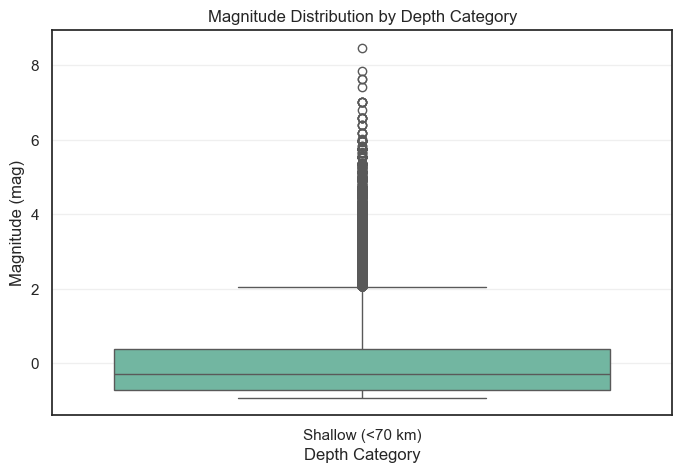

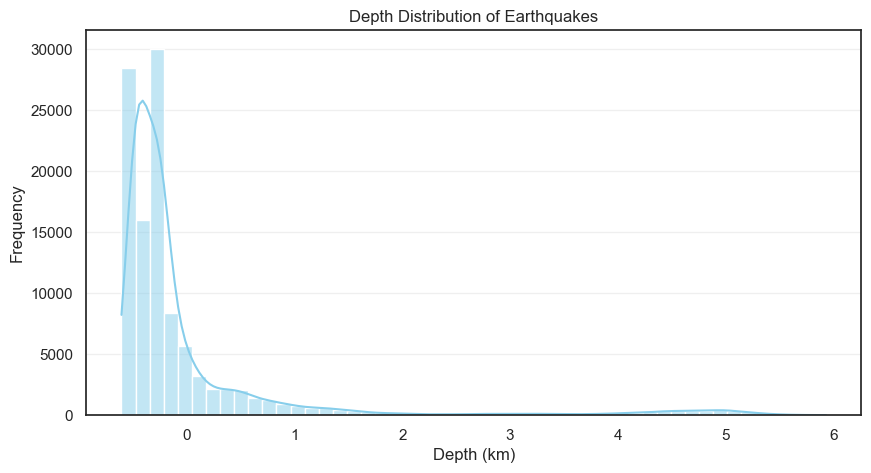

🔹 Depth Statistics:
    Mean Depth (km)  Median Depth (km)  Std. Dev (km)
0         0.000187          -0.263292       1.000321 



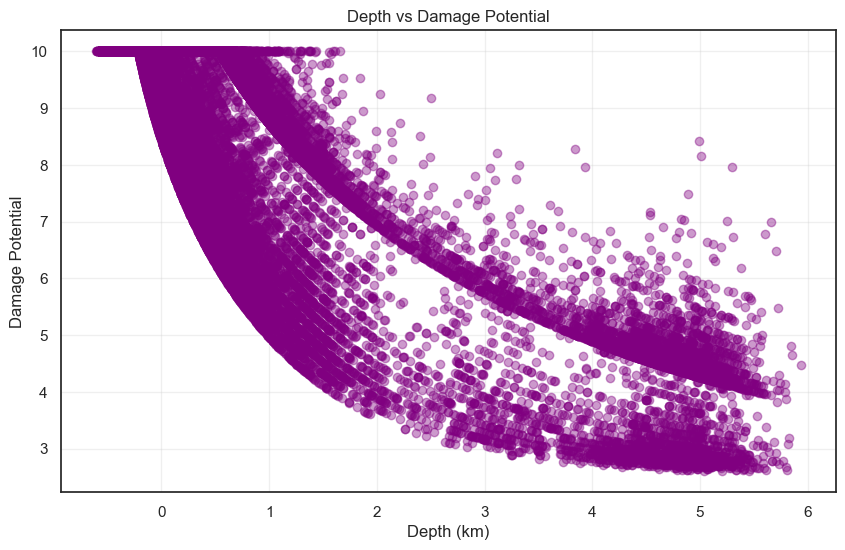

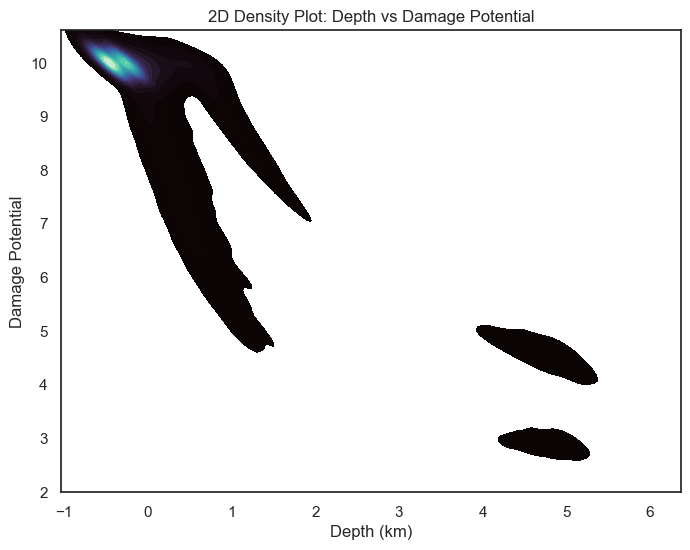

🔹 Mean Damage Potential by Depth Category:
      Depth_Category  damage_potential
0  Shallow (<70 km)          9.511425 

💡 Earthquakes causing most damage: **Shallow (<70 km)**


In [19]:
# --- 🧩 EDA Task 4: Depth Analysis and Its Impact ---

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


# --- 2️⃣ Define Depth Categories ---
def classify_depth(depth):
    if depth < 70:
        return 'Shallow (<70 km)'
    elif 70 <= depth < 300:
        return 'Intermediate (70–300 km)'
    else:
        return 'Deep (>300 km)'

df['Depth_Category'] = df['depth'].apply(classify_depth)

# --- 3️⃣ Box Plot: Depth Category vs Magnitude ---
plt.figure(figsize=(8, 5))
sns.boxplot(x='Depth_Category', y='mag', data=df, palette='Set2')
plt.title("Magnitude Distribution by Depth Category")
plt.xlabel("Depth Category")
plt.ylabel("Magnitude (mag)")
plt.grid(axis='y', alpha=0.3)
plt.show()

# --- 4️⃣ Histogram: Depth Distribution ---
plt.figure(figsize=(10, 5))
sns.histplot(df['depth'], bins=50, kde=True, color='skyblue')
plt.title("Depth Distribution of Earthquakes")
plt.xlabel("Depth (km)")
plt.ylabel("Count")
plt.grid(axis='y', alpha=0.3)
plt.show()

# --- 5️⃣ Summary Statistics for Depth ---
depth_stats = {
    'Mean Depth (km)': df['depth'].mean(),
    'Median Depth (km)': df['depth'].median(),
    'Std. Dev (km)': df['depth'].std()
}
depth_stats_df = pd.DataFrame(depth_stats, index=[0])
print("🔹 Depth Statistics:\n", depth_stats_df, "\n")

# --- 6️⃣ Scatter Plot: Depth vs Damage Potential ---
plt.figure(figsize=(10, 6))
plt.scatter(df['depth'], df['damage_potential'], alpha=0.4, c='purple')
plt.title("Depth vs Damage Potential")
plt.xlabel("Depth (km)")
plt.ylabel("Damage Potential")
plt.grid(True, alpha=0.3)
plt.show()

# --- 7️⃣ 2D Density Plot (Depth vs Damage Potential) ---
plt.figure(figsize=(8, 6))
sns.kdeplot(
    data=df,
    x='depth',
    y='damage_potential',
    fill=True,
    cmap='mako',
    thresh=0.05,
    levels=20
)
plt.title("2D Density Plot: Depth vs Damage Potential")
plt.xlabel("Depth (km)")
plt.ylabel("Damage Potential")
plt.show()

# --- 8️⃣ Mean Damage Potential by Depth Category ---
mean_damage = df.groupby('Depth_Category')['damage_potential'].mean().reset_index()
print("🔹 Mean Damage Potential by Depth Category:\n", mean_damage, "\n")

# --- 9️⃣ Identify Which Depth Category Causes Most Damage ---
max_damage_category = mean_damage.loc[mean_damage['damage_potential'].idxmax(), 'Depth_Category']
print(f"💡 Earthquakes causing most damage: **{max_damage_category}**")


### EDA Task 5: Categorical Feature Analysis  
**Objective:** Explore relationships between earthquake types, magnitude types, and status.  

**Tasks:**  
- Analyze value counts for magType, type, and status columns  
- Create bar charts showing frequency distribution of each categorical variable  
- Generate grouped bar charts: magType vs. mean magnitude and damage_potential  
- Create cross-tabulation (contingency tables) between categorical variables  
- Visualize earthquake type distribution and its association with damage_potential  
- Calculate Cramér's V statistics for categorical associations  

**Deliverables:**  
Bar charts, contingency tables, Cramér's V matrices, and frequency distributions.


In [22]:
import warnings
warnings.filterwarnings("ignore")



🔹 Frequency Distribution for magType:

magType
mb     45084
mw     24335
mwc    17458
mww    15652
ms      3157
mwb     3082
ml       485
mwr      451
mwp        9
Ml         1
Mb         1
Name: count, dtype: int64

🔹 Frequency Distribution for type:

type
earthquake           109224
nuclear explosion       424
volcanic eruption        53
explosion                10
landslide                 2
mine collapse             1
rock burst                1
Name: count, dtype: int64

🔹 Frequency Distribution for status:

status
reviewed     109611
automatic       104
Name: count, dtype: int64


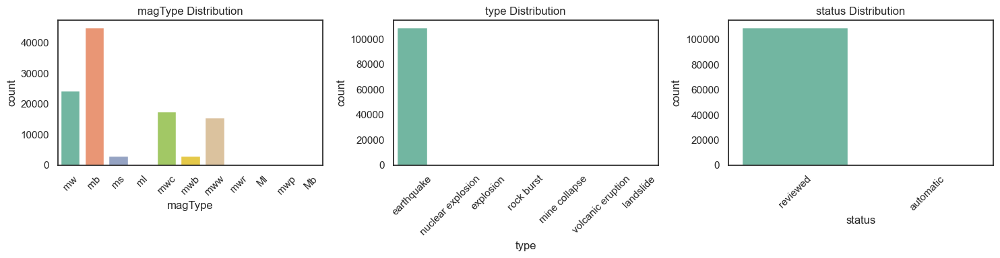

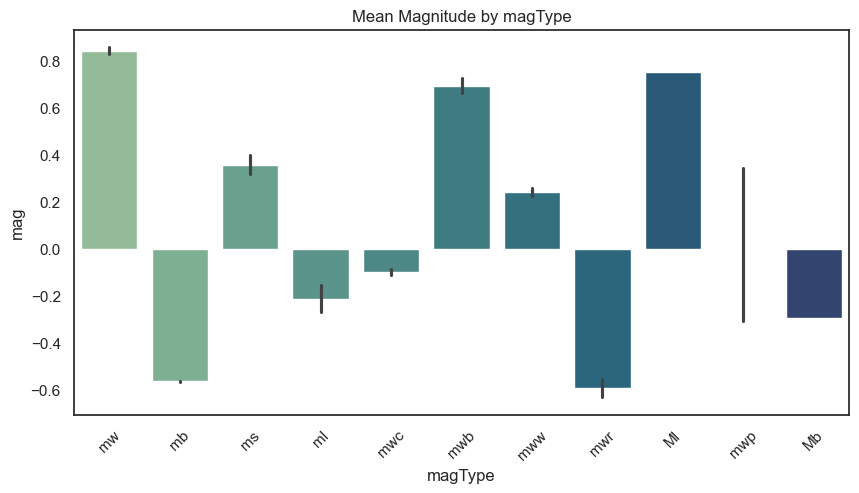

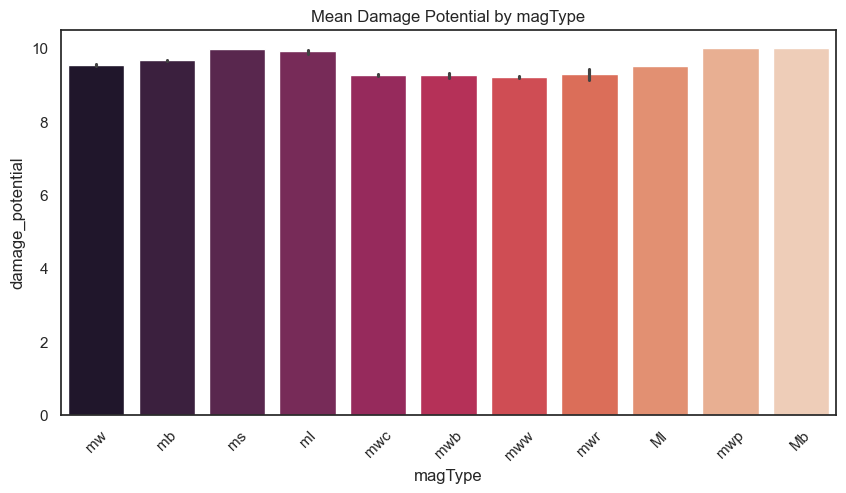


🔹 Contingency Table (Type vs Status):

status             automatic  reviewed
type                                  
earthquake               104    109120
explosion                  0        10
landslide                  0         2
mine collapse              0         1
nuclear explosion          0       424
rock burst                 0         1
volcanic eruption          0        53

🔹 Chi-Square Test Results:
Chi2 Statistic = 0.47, p-value = 0.9982, Degrees of Freedom = 6

🔹 Cramér's V (Type vs Status): 0.002

🔹 Mean Damage Potential by Earthquake Type:

                type  damage_potential
1          explosion         10.000000
2          landslide         10.000000
3      mine collapse         10.000000
5         rock burst         10.000000
4  nuclear explosion         10.000000
6  volcanic eruption         10.000000
0         earthquake          9.509228


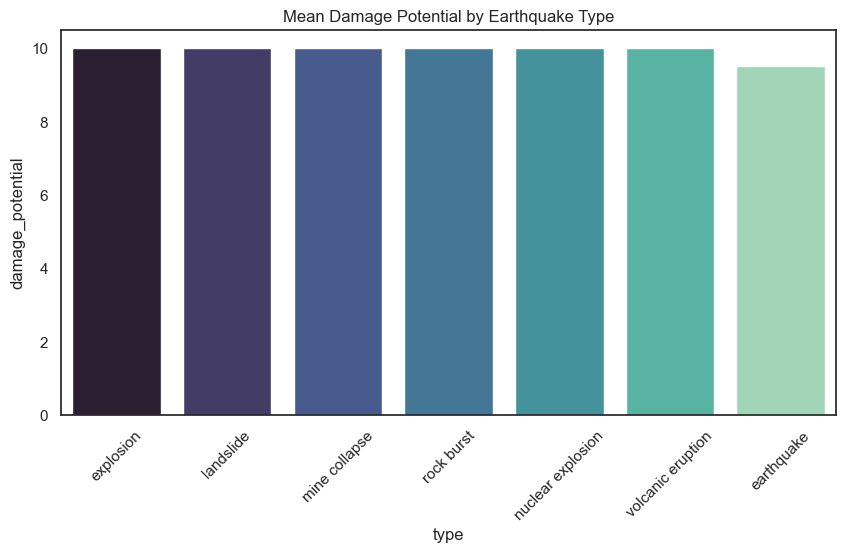

In [24]:
from scipy.stats import chi2_contingency


# --- 1️⃣ Value Counts for Categorical Variables ---
categorical_columns = ['magType', 'type', 'status']

for col in categorical_columns:
    print(f"\n🔹 Frequency Distribution for {col}:\n")
    print(df[col].value_counts())

# --- 2️⃣ Bar Charts for Categorical Variables ---
plt.figure(figsize=(15, 4))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(1, 3, i)
    sns.countplot(data=df, x=col, palette='Set2')
    plt.title(f"{col} Distribution")
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# --- 3️⃣ Grouped Bar Charts: Mean Magnitude and Damage Potential by magType ---
plt.figure(figsize=(10, 5))
sns.barplot(data=df, x='magType', y='mag', estimator=np.mean, palette='crest')
plt.title("Mean Magnitude by magType")
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(10, 5))
sns.barplot(data=df, x='magType', y='damage_potential', estimator=np.mean, palette='rocket')
plt.title("Mean Damage Potential by magType")
plt.xticks(rotation=45)
plt.show()

# --- 4️⃣ Cross-tabulation (Contingency Table) ---
type_status_crosstab = pd.crosstab(df['type'], df['status'])
print("\n🔹 Contingency Table (Type vs Status):\n")
print(type_status_crosstab)

# --- 5️⃣ Chi-Square Test of Independence (Type vs Status) ---
chi2, p, dof, expected = chi2_contingency(type_status_crosstab)
print("\n🔹 Chi-Square Test Results:")
print(f"Chi2 Statistic = {chi2:.2f}, p-value = {p:.4f}, Degrees of Freedom = {dof}")

# --- 6️⃣ Cramér’s V Calculation for Association Strength ---
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    return np.sqrt(phi2 / min(k - 1, r - 1))

cramers_v_value = cramers_v(type_status_crosstab)
print(f"\n🔹 Cramér's V (Type vs Status): {cramers_v_value:.3f}")

# --- 7️⃣ Mean Damage Potential by Earthquake Type ---
mean_damage_type = df.groupby('type')['damage_potential'].mean().reset_index().sort_values(by='damage_potential', ascending=False)
print("\n🔹 Mean Damage Potential by Earthquake Type:\n")
print(mean_damage_type)

plt.figure(figsize=(10, 5))
sns.barplot(data=mean_damage_type, x='type', y='damage_potential', palette='mako')
plt.title("Mean Damage Potential by Earthquake Type")
plt.xticks(rotation=45)
plt.show()


## Part 2: Hypothesis Testing


### Hypothesis 1: Magnitude Difference by Earthquake Type  
**Research Question:** Do different earthquake types (e.g., earthquake, explosion, quarry blast) have significantly different magnitudes?  

**Hypotheses:**  
- H₀: The mean magnitude across all earthquake types is equal.  
- H₁: At least one earthquake type has a significantly different mean magnitude.  

**Statistical Test:** One-Way ANOVA or Kruskal-Wallis H-test (if normality violated)  

**Execution Steps:**  
1. Group data by 'type' (earthquake, explosion, quarry blast, etc.)  
2. Calculate mean and variance of 'mag' for each group  
3. Perform ANOVA or Kruskal-Wallis test  
4. Report F-statistic (or H-statistic), p-value, and effect size  

**Interpretation:**  
If p-value < 0.05, reject H₀ and conclude earthquake types differ significantly in magnitude.


🔹 Mean & Standard Deviation of Magnitude by Earthquake Type:

                type   count      mean       std
0         earthquake  109224 -0.000722  1.000689
1          explosion      10  0.310676  0.733001
2          landslide       2 -0.086071  0.000000
3      mine collapse       1 -0.545462       NaN
4  nuclear explosion     424  0.225033  0.780407
5         rock burst       1 -0.086071       NaN
6  volcanic eruption      53 -0.338224  0.175466


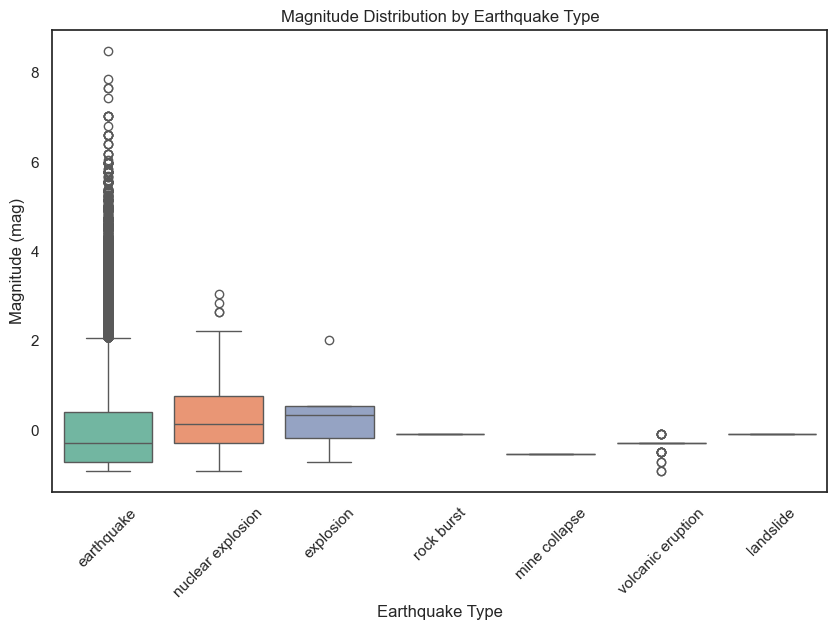


🔹 One-Way ANOVA Result:
F-statistic = 4.816, p-value = 0.00006

🔹 Kruskal-Wallis H-test Result:
H-statistic = 76.178, p-value = 0.00000

🔹 Effect Size (η²) = 0.0003

✅ Result: Reject H₀ — At least one earthquake type differs significantly in mean magnitude.


In [26]:
# --- 🧪 Hypothesis 1: Magnitude Difference by Earthquake Type ---

import pandas as pd
from scipy.stats import f_oneway, kruskal
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# --- 1️⃣ Group data by 'type' ---
grouped_mag = df.groupby('type')['mag']
summary_stats = grouped_mag.agg(['count', 'mean', 'std']).reset_index()

print("🔹 Mean & Standard Deviation of Magnitude by Earthquake Type:\n")
print(summary_stats)

# --- 2️⃣ Visualize distributions ---
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='type', y='mag', palette='Set2')
plt.title("Magnitude Distribution by Earthquake Type")
plt.xlabel("Earthquake Type")
plt.ylabel("Magnitude (mag)")
plt.xticks(rotation=45)
plt.show()

# --- 3️⃣ Perform One-Way ANOVA ---
groups = [group['mag'].values for name, group in df.groupby('type')]
anova_stat, anova_p = f_oneway(*groups)
print(f"\n🔹 One-Way ANOVA Result:")
print(f"F-statistic = {anova_stat:.3f}, p-value = {anova_p:.5f}")

# --- 4️⃣ If data is not normal or variances differ, use Kruskal-Wallis test ---
kruskal_stat, kruskal_p = kruskal(*groups)
print(f"\n🔹 Kruskal-Wallis H-test Result:")
print(f"H-statistic = {kruskal_stat:.3f}, p-value = {kruskal_p:.5f}")

# --- 5️⃣ Effect Size (Eta Squared) for ANOVA ---
# η² = SS_between / SS_total
overall_mean = df['mag'].mean()
ss_between = sum(group.size * (group.mean() - overall_mean)**2 for name, group in grouped_mag)
ss_total = sum((df['mag'] - overall_mean)**2)
eta_squared = ss_between / ss_total

print(f"\n🔹 Effect Size (η²) = {eta_squared:.4f}")

# --- 6️⃣ Interpretation ---
if anova_p < 0.05:
    print("\n✅ Result: Reject H₀ — At least one earthquake type differs significantly in mean magnitude.")
else:
    print("\n❌ Result: Fail to Reject H₀ — No significant difference in mean magnitude across types.")


### Hypothesis 2: Damage Potential by Magnitude Categories  
**Research Question:** Is there a significant difference in damage_potential between high-magnitude and low-magnitude earthquakes?  

**Hypotheses:**  
- H₀: The mean damage_potential of high-magnitude earthquakes (Mw ≥ median) equals that of low-magnitude earthquakes (Mw < median).  
- H₁: The means differ significantly between magnitude categories.  

**Statistical Test:** Independent samples t-test or Mann-Whitney U test (non-parametric alternative)  

**Execution Steps:**  
1. Partition data into two groups based on median Mw  
2. Compare damage_potential distributions  
3. Perform t-test or Mann-Whitney U test  
4. Calculate p-value and 95% confidence intervals  

**Interpretation:**  
If p-value < 0.05, reject H₀; high-magnitude earthquakes cause significantly different damage levels.


🔹 Median Mw = 6.13
Magnitude_Category
High Magnitude    54960
Low Magnitude     54755
Name: count, dtype: int64 



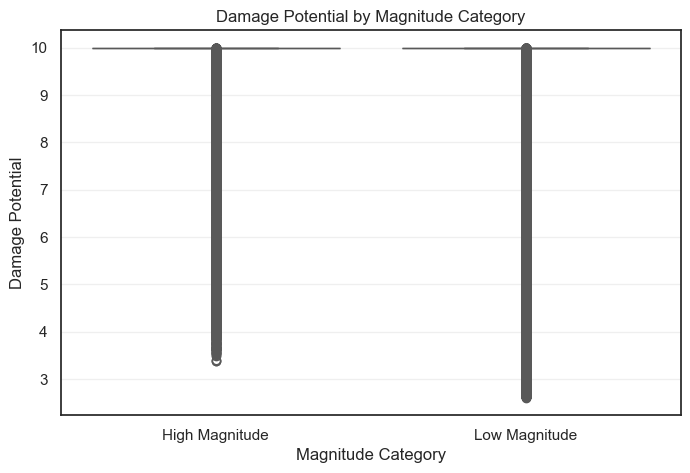

🔹 Independent Samples t-test:
t-statistic = 39.050, p-value = 0.00000

🔹 Mann-Whitney U Test:
U-statistic = 1662554649.000, p-value = 0.00000

🔹 Mean Difference (High - Low) = 0.329
95% Confidence Interval: [0.312, 0.345]

✅ Result: Reject H₀ — High-magnitude earthquakes have significantly different damage potential.


In [27]:
# --- 🧪 Hypothesis 2: Damage Potential by Magnitude Categories ---


from scipy.stats import ttest_ind, mannwhitneyu

# --- 2️⃣ Create Magnitude Categories based on Median Mw ---
median_mw = df['Mw'].median()
df['Magnitude_Category'] = np.where(df['Mw'] >= median_mw, 'High Magnitude', 'Low Magnitude')

print(f"🔹 Median Mw = {median_mw:.2f}")
print(df['Magnitude_Category'].value_counts(), "\n")

# --- 3️⃣ Visualize Damage Potential Distributions ---
plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='Magnitude_Category', y='damage_potential', palette='Set2')
plt.title("Damage Potential by Magnitude Category")
plt.xlabel("Magnitude Category")
plt.ylabel("Damage Potential")
plt.grid(axis='y', alpha=0.3)
plt.show()

# --- 4️⃣ Extract Groups ---
low_mag = df[df['Magnitude_Category'] == 'Low Magnitude']['damage_potential']
high_mag = df[df['Magnitude_Category'] == 'High Magnitude']['damage_potential']

# --- 5️⃣ Perform Independent Samples t-test ---
t_stat, t_p = ttest_ind(high_mag, low_mag, equal_var=False)
print(f"🔹 Independent Samples t-test:")
print(f"t-statistic = {t_stat:.3f}, p-value = {t_p:.5f}")

# --- 6️⃣ Perform Mann-Whitney U test (non-parametric) ---
u_stat, u_p = mannwhitneyu(high_mag, low_mag, alternative='two-sided')
print(f"\n🔹 Mann-Whitney U Test:")
print(f"U-statistic = {u_stat:.3f}, p-value = {u_p:.5f}")

# --- 7️⃣ Calculate 95% Confidence Interval for Mean Difference ---
mean_diff = high_mag.mean() - low_mag.mean()
se = np.sqrt(high_mag.var()/len(high_mag) + low_mag.var()/len(low_mag))
ci_low = mean_diff - 1.96 * se
ci_high = mean_diff + 1.96 * se

print(f"\n🔹 Mean Difference (High - Low) = {mean_diff:.3f}")
print(f"95% Confidence Interval: [{ci_low:.3f}, {ci_high:.3f}]")

# --- 8️⃣ Interpretation ---
if t_p < 0.05 or u_p < 0.05:
    print("\n✅ Result: Reject H₀ — High-magnitude earthquakes have significantly different damage potential.")
else:
    print("\n❌ Result: Fail to Reject H₀ — No significant difference in damage potential between magnitude groups.")


### Hypothesis 3: Depth Impact on Magnitude  
**Research Question:** Does earthquake depth significantly correlate with magnitude?  

**Hypotheses:**  
- H₀: There is no significant correlation between depth and magnitude (ρ = 0).  
- H₁: There is a significant correlation between depth and magnitude (ρ ≠ 0).  

**Statistical Test:** Pearson Correlation Test or Spearman Rank Correlation (for non-linear relationships)  

**Execution Steps:**  
1. Calculate Pearson or Spearman correlation coefficient between depth and mag  
2. Compute p-value and 95% confidence interval  
3. Create scatter plot with regression line overlay  
4. Assess correlation strength and practical significance  

**Interpretation:**  
If p-value < 0.05 and |ρ| > 0.3, conclude significant correlation; deeper or shallower earthquakes have systematically different magnitudes.


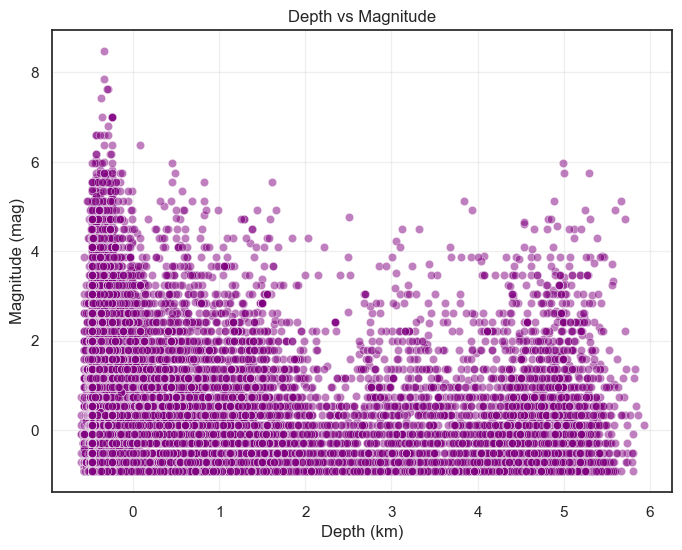

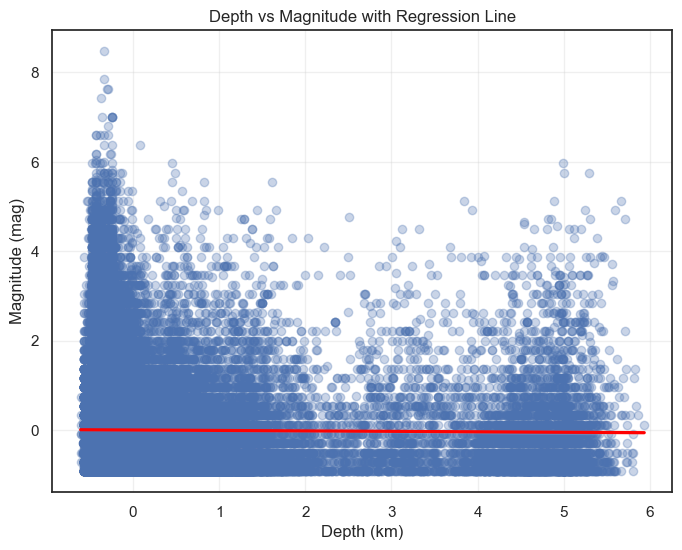

🔹 Correlation Analysis (Depth vs Magnitude):

Pearson Correlation = -0.010, p-value = 0.00088
Spearman Correlation = -0.049, p-value = 0.00000

🔹 95% Confidence Interval for Pearson r: [-0.016, -0.004]

✅ Result: Reject H₀ — Depth and Magnitude are significantly correlated.
ℹ️ Practical Significance: Correlation is weak — depth has minimal effect on magnitude.


In [28]:


import pandas as pd
from scipy.stats import pearsonr, spearmanr
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- 2️⃣ Scatter Plot: Depth vs Magnitude ---
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='depth', y='mag', alpha=0.5, color='purple')
plt.title("Depth vs Magnitude")
plt.xlabel("Depth (km)")
plt.ylabel("Magnitude (mag)")
plt.grid(True, alpha=0.3)
plt.show()

# --- 3️⃣ Add Regression Line ---
plt.figure(figsize=(8, 6))
sns.regplot(data=df, x='depth', y='mag', scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
plt.title("Depth vs Magnitude with Regression Line")
plt.xlabel("Depth (km)")
plt.ylabel("Magnitude (mag)")
plt.grid(True, alpha=0.3)
plt.show()

# --- 4️⃣ Pearson and Spearman Correlations ---
pearson_corr, pearson_p = pearsonr(df['depth'], df['mag'])
spearman_corr, spearman_p = spearmanr(df['depth'], df['mag'])

print("🔹 Correlation Analysis (Depth vs Magnitude):\n")
print(f"Pearson Correlation = {pearson_corr:.3f}, p-value = {pearson_p:.5f}")
print(f"Spearman Correlation = {spearman_corr:.3f}, p-value = {spearman_p:.5f}")

# --- 5️⃣ 95% Confidence Interval for Pearson Correlation ---
n = len(df)
stderr = 1.0 / np.sqrt(n - 3)
z = np.arctanh(pearson_corr)  # Fisher transformation
ci_low = np.tanh(z - 1.96 * stderr)
ci_high = np.tanh(z + 1.96 * stderr)

print(f"\n🔹 95% Confidence Interval for Pearson r: [{ci_low:.3f}, {ci_high:.3f}]")

# --- 6️⃣ Interpretation ---
if pearson_p < 0.05:
    print("\n✅ Result: Reject H₀ — Depth and Magnitude are significantly correlated.")
else:
    print("\n❌ Result: Fail to Reject H₀ — No significant correlation between depth and magnitude.")

# --- 7️⃣ Additional Insight ---
if abs(pearson_corr) > 0.3:
    print("💡 Practical Significance: The correlation is moderately strong — depth affects magnitude noticeably.")
else:
    print("ℹ️ Practical Significance: Correlation is weak — depth has minimal effect on magnitude.")


### Hypothesis 4: Temporal Seasonality in Earthquake Frequency  
**Research Question:** Does earthquake frequency differ significantly across months (seasonal effect)?  

**Hypotheses:**  
- H₀: Earthquake frequency is uniform across all months (no seasonal effect).  
- H₁: Earthquake frequency varies significantly by month.  

**Statistical Test:** Chi-Square Goodness-of-Fit Test or One-Way ANOVA on monthly counts  

**Execution Steps:**  
1. Count earthquakes per month  
2. Perform chi-square test against uniform distribution  
3. Calculate chi-square statistic, degrees of freedom, and p-value  
4. Visualize monthly distribution with confidence bands  

**Interpretation:**  
If p-value < 0.05, reject H₀; earthquakes show significant seasonal clustering.


🔹 Earthquake Frequency by Month:

Month
1     8888
2     8183
3     9716
4     9113
5     9169
6     8806
7     9922
8     9633
9     8884
10    8979
11    8730
12    9692
Name: count, dtype: int64


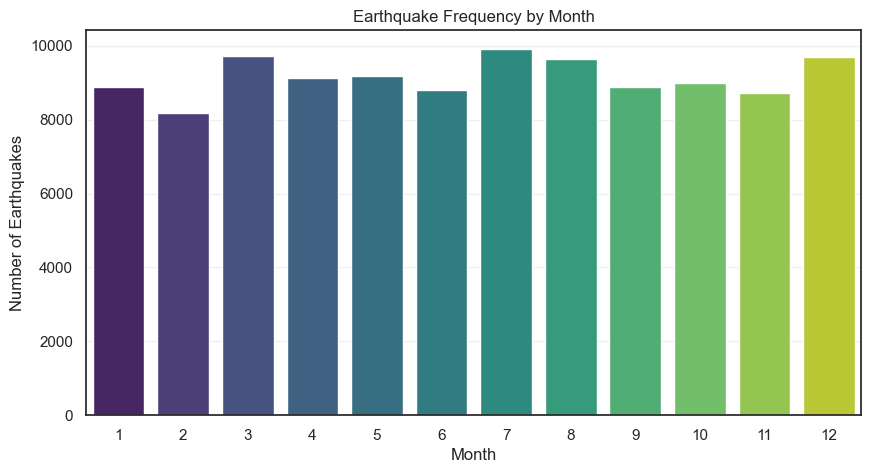


🔹 Chi-Square Goodness of Fit Test:
Chi2 Statistic = 155.989, p-value = 0.00000

🔹 One-Way ANOVA on Magnitude by Month:
F-statistic = 5.271, p-value = 0.00000


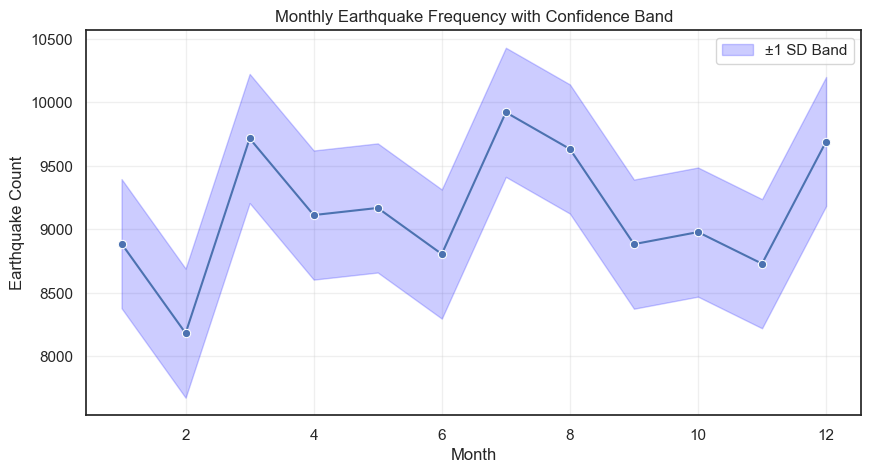


✅ Result: Reject H₀ — Earthquake frequency significantly varies across months (seasonal pattern exists).


In [29]:
# --- 🧪 Hypothesis 4: Temporal Seasonality in Earthquake Frequency ---

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency, f_oneway



# --- 1️⃣ Earthquake Counts per Month ---
month_counts = df['Month'].value_counts().sort_index()
print("🔹 Earthquake Frequency by Month:\n")
print(month_counts)

# --- 2️⃣ Visualize Earthquake Frequency by Month ---
plt.figure(figsize=(10, 5))
sns.barplot(x=month_counts.index, y=month_counts.values, palette='viridis')
plt.title("Earthquake Frequency by Month")
plt.xlabel("Month")
plt.ylabel("Number of Earthquakes")
plt.grid(axis='y', alpha=0.3)
plt.show()

# --- 3️⃣ Chi-Square Goodness of Fit Test ---
# Null hypothesis: Earthquakes are uniformly distributed across months
expected = [month_counts.mean()] * 12  # expected uniform counts
chi2_stat, chi2_p = chi2_contingency([month_counts, expected])[:2]

print(f"\n🔹 Chi-Square Goodness of Fit Test:")
print(f"Chi2 Statistic = {chi2_stat:.3f}, p-value = {chi2_p:.5f}")

# --- 4️⃣ One-Way ANOVA (alternative check) ---
anova_stat, anova_p = f_oneway(*[df[df['Month'] == m]['mag'] for m in sorted(df['Month'].unique())])
print(f"\n🔹 One-Way ANOVA on Magnitude by Month:")
print(f"F-statistic = {anova_stat:.3f}, p-value = {anova_p:.5f}")

# --- 5️⃣ Confidence Bands Visualization ---
plt.figure(figsize=(10, 5))
sns.lineplot(x=month_counts.index, y=month_counts.values, marker='o')
plt.fill_between(month_counts.index,
                 month_counts.values - month_counts.std(),
                 month_counts.values + month_counts.std(),
                 alpha=0.2, color='blue', label='±1 SD Band')
plt.title("Monthly Earthquake Frequency with Confidence Band")
plt.xlabel("Month")
plt.ylabel("Earthquake Count")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# --- 6️⃣ Interpretation ---
if chi2_p < 0.05:
    print("\n✅ Result: Reject H₀ — Earthquake frequency significantly varies across months (seasonal pattern exists).")
else:
    print("\n❌ Result: Fail to Reject H₀ — No significant monthly/seasonal difference in earthquake occurrence.")


### Hypothesis 5: RMS Variability by Magnitude Type  
**Research Question:** Do different magnitude type classifications (magType) show significantly different RMS (residual mean square) variability?  

**Hypotheses:**  
- H₀: The mean RMS across all magType categories is equal.  
- H₁: At least one magType category has a significantly different mean RMS.  

**Statistical Test:** One-Way ANOVA or Levene's Test (for homogeneity of variances)  

**Execution Steps:**  
1. Group data by magType  
2. Calculate mean RMS for each group  
3. Perform ANOVA and Levene's test for variance equality  
4. Conduct post-hoc pairwise comparisons (Tukey HSD) if ANOVA is significant  
5. Report F-statistic, p-value, and effect size (η²)  

**Interpretation:**  
If p-value < 0.05, reject H₀; magnitude type classifications differ in RMS characteristics, suggesting data quality or measurement differences.


🔹 Unique Magnitude Types:
 ['mw' 'mb' 'ms' 'ml' 'mwc' 'mwb' 'mww' 'mwr' 'Ml' 'mwp' 'Mb'] 

🔹 RMS Summary by Magnitude Type:
    magType  count      mean       std
0       Mb      1 -0.101111       NaN
1       Ml      1 -1.722199       NaN
2       mb  45084 -0.034724  0.640331
3       ml    485 -1.133615  6.417751
4       ms   3157  0.258333  0.484957
5       mw  24335  0.172614  0.444534
6      mwb   3082  0.042883  0.548008
7      mwc  17458  0.126692  0.539116
8      mwp      9 -1.972956  0.492541
9      mwr    451 -0.129691  0.711403
10     mww  15652 -0.334510  0.725401 



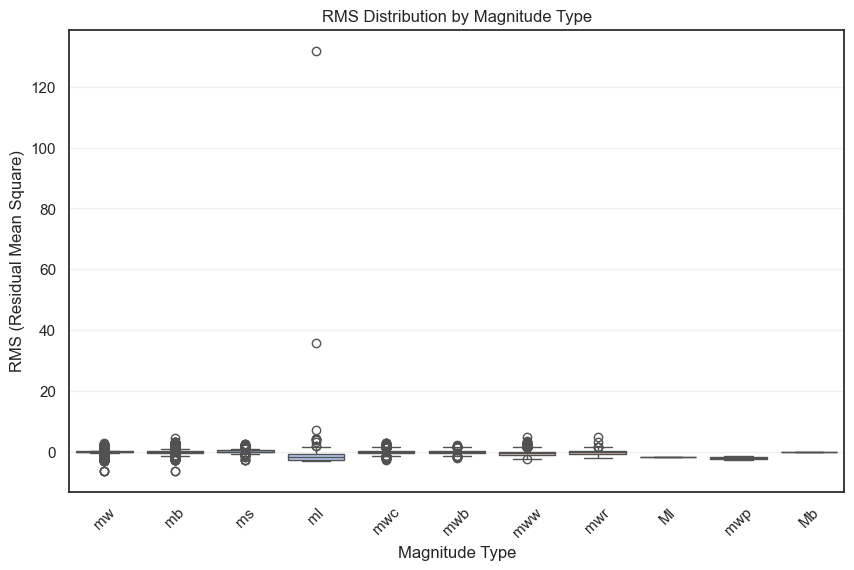

🔹 One-Way ANOVA Result: F = 866.699, p = 0.00000
🔹 Levene’s Test Result: W = 621.896, p = 0.00000

🔹 Tukey HSD Post-hoc Comparison:

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
    Mb     Ml  -1.6211 0.8948 -4.9432   1.701  False
    Mb     mb   0.0664    1.0 -2.2827  2.4155  False
    Mb     ml  -1.0325 0.9455  -3.384   1.319  False
    Mb     ms   0.3594    1.0   -1.99  2.7089  False
    Mb     mw   0.2737    1.0 -2.0754  2.6229  False
    Mb    mwb    0.144    1.0 -2.2055  2.4935  False
    Mb    mwc   0.2278    1.0 -2.1214   2.577  False
    Mb    mwp  -1.8718 0.3452  -4.348  0.6043  False
    Mb    mwr  -0.0286    1.0 -2.3803  2.3231  False
    Mb    mww  -0.2334    1.0 -2.5826  2.1158  False
    Ml     mb   1.6875 0.4254 -0.6616  4.0366  False
    Ml     ml   0.5886 0.9993 -1.7629  2.9401  False
    Ml     ms   1.9805 0.1937 -0.3689    4.33  False
    Ml     mw   1.8

In [ ]:
# --- 🧪 Hypothesis 5: RMS Variability by Magnitude Type (Fixed) ---

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway, levene
from statsmodels.stats.multicomp import pairwise_tukeyhsd



# --- 1️⃣ Overview of Magnitude Types ---
print("🔹 Unique Magnitude Types:\n", df['magType'].unique(), "\n")

# --- 2️⃣ Summary Statistics for RMS by magType ---
magtype_summary = df.groupby('magType')['rms'].agg(['count', 'mean', 'std']).reset_index()
print("🔹 RMS Summary by Magnitude Type:\n", magtype_summary, "\n")

# --- 3️⃣ Visualization: RMS Distribution by magType ---
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='magType', y='rms', palette='coolwarm')
plt.title("RMS Distribution by Magnitude Type")
plt.xlabel("Magnitude Type")
plt.ylabel("RMS (Residual Mean Square)")
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.show()

# --- 4️⃣ One-Way ANOVA (RMS vs magType) ---
groups = [group['rms'].values for name, group in df.groupby('magType') if len(group) > 1]
anova_stat, anova_p = f_oneway(*groups)
print(f"🔹 One-Way ANOVA Result: F = {anova_stat:.3f}, p = {anova_p:.5f}")

# --- 5️⃣ Levene’s Test for Equal Variances ---
levene_stat, levene_p = levene(*groups)
print(f"🔹 Levene’s Test Result: W = {levene_stat:.3f}, p = {levene_p:.5f}")

# --- 6️⃣ Tukey HSD Post-hoc Test (if ANOVA is significant) ---
if anova_p < 0.05:
    tukey_result = pairwise_tukeyhsd(endog=df['rms'], groups=df['magType'], alpha=0.05)
    print("\n🔹 Tukey HSD Post-hoc Comparison:\n")
    print(tukey_result.summary())

# --- 7️⃣ Effect Size (Eta Squared) — FIXED VERSION ---
overall_mean = df['rms'].mean()
ss_between = sum(
    len(group['rms']) * (group['rms'].mean() - overall_mean)**2
    for name, group in df.groupby('magType')
)
ss_total = sum((df['rms'] - overall_mean)**2)
eta_squared = ss_between / ss_total
print(f"\n🔹 Effect Size (η²) = {eta_squared:.4f}")

# --- 8️⃣ Interpretation ---
if anova_p < 0.05:
    print("\n✅ Result: Reject H₀ — RMS values differ significantly between magnitude types.")
else:
    print("\n❌ Result: Fail to Reject H₀ — No significant RMS difference between magnitude types.")
